# HTAP Emissions Analysis: India 2019 vs 2020

This notebook presents a comparative analysis of emissions data from the HTAP dataset
for the years 2019 and 2020.  
The focus is on global patterns, with focus into the Indian subcontinent.

In [12]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

## Dataset Overview

We use HTAP emissions data for the years 2019 and 2020.  
The dataset contains spatially gridded emissions for multiple categories.

In [6]:
ds_2019 = xr.open_dataset(r"C:\Users\Deena\Desktop\IITGN\current\HTAP\edgar_HTAPv31_2019_PM2.5.nc")  
ds_2020 = xr.open_dataset(r"C:\Users\Deena\Desktop\IITGN\current\HTAP\edgar_HTAPv31_2020_PM2.5.nc")

In [9]:
ds_2019, ds_2020

(<xarray.Dataset>
 Dimensions:                                  (time: 12, lat: 360, lon: 720)
 Coordinates:
   * lat                                      (lat) float64 -89.75 ... 89.75
   * lon                                      (lon) float64 -179.8 ... 179.8
   * time                                     (time) datetime64[ns] 2019-01-15...
 Data variables: (12/20)
     HTAPv3_1_International_Shipping          (time, lat, lon) float32 ...
     HTAPv3_2_1_1_Domestic_Aviation_LTO       (time, lat, lon) float32 ...
     HTAPv3_2_1_2_Domestic_Aviation_CDS       (time, lat, lon) float32 ...
     HTAPv3_2_1_3_Domestic_Aviation_CRS       (time, lat, lon) float32 ...
     HTAPv3_2_2_1_International_Aviation_LTO  (time, lat, lon) float32 ...
     HTAPv3_2_2_2_International_Aviation_CDS  (time, lat, lon) float32 ...
     ...                                       ...
     HTAPv3_5_4_Other_ground_transport        (time, lat, lon) float32 ...
     HTAPv3_6_Residential                     (time, l

## Global Emission Comparison

We begin with a global view of category-wise emissions in 2019 vs 2020.

In [14]:
def read_files(file_2019, file_2020):
    ds_2019 = xr.open_dataset(file_2019)
    ds_2020 = xr.open_dataset(file_2020)
    
    return ds_2019, ds_2020

In [16]:
def calculate_percentiles(data_array):
    # Remove NaN values for percentile calculation
    valid_data = data_array.values[~np.isnan(data_array.values)]
    
    if len(valid_data) == 0:
        return 0, 0
    
    p10 = np.percentile(valid_data, 10)
    p90 = np.percentile(valid_data, 90)
    
    # print(f"10th percentile: {p10:.2e}")
    # print(f"90th percentile: {p90:.2e}")
    
    return p10, p90

In [18]:
def filter_data_by_percentiles(data_array, p10, p90):
    
    filtered_data = data_array.copy()
    filtered_data = filtered_data.where((filtered_data >= p10) & (filtered_data <= p90))
    
    return filtered_data

In [20]:
def plot_side_by_side(ds_2019, ds_2020, variable_name, month):

    data_2019 = ds_2019[variable_name].sel(time=ds_2019.time.dt.month == month)
    data_2020 = ds_2020[variable_name].sel(time=ds_2020.time.dt.month == month)
    
    # If multiple time steps for the same month, take the mean
    if len(data_2019.time) > 1:
        data_2019 = data_2019.mean(dim='time')
    else:
        data_2019 = data_2019.squeeze()
        
    if len(data_2020.time) > 1:
        data_2020 = data_2020.mean(dim='time')
    else:
        data_2020 = data_2020.squeeze()
    
    print(f"Calculating percentiles for {variable_name}...")
    p10_2019, p90_2019 = calculate_percentiles(data_2019)
    p10_2020, p90_2020 = calculate_percentiles(data_2020)
    
    # Use the combined percentiles from both years for consistent filtering
    combined_data = xr.concat([data_2019, data_2020], dim='temp')
    p10_combined, p90_combined = calculate_percentiles(combined_data)
    
    # Filter data by percentiles (but keep original values)
    filtered_2019 = filter_data_by_percentiles(data_2019, p10_2019, p90_2019)
    filtered_2020 = filter_data_by_percentiles(data_2020, p10_2020, p90_2020)
    
    # Create figure with side-by-side subplots
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(20, 10),
                                   subplot_kw={'projection': ccrs.PlateCarree()})
    
    # Add map features
    for ax in [ax1, ax2]:
        ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
        ax.add_feature(cfeature.BORDERS, linewidth=0.3)
        # ax.add_feature(cfeature.OCEAN, color='lightblue', alpha=0.3)
        # ax.add_feature(cfeature.LAND, color='lightgray', alpha=0.3)
        ax.set_global()
        
        # Add gridlines
        gl = ax.gridlines(draw_labels=True, alpha=0.3)
        gl.top_labels = False
        gl.right_labels = False
    
    # Use the same colormap and scale for both plots
    vmin = min(filtered_2019.min().values, filtered_2020.min().values)
    vmax = max(filtered_2019.max().values, filtered_2020.max().values)
    
    # Plot 2019 data
    im1 = filtered_2019.plot(ax=ax1, transform=ccrs.PlateCarree(), 
                            cmap='turbo', add_colorbar=False, 
                            alpha=0.8, vmin=vmin, vmax=vmax)
    ax1.set_title(f'2019 {variable_name} - Month {month}', 
                  fontsize=12, fontweight='bold')
    
    # Plot 2020 data
    im2 = filtered_2020.plot(ax=ax2, transform=ccrs.PlateCarree(), 
                            cmap='turbo', add_colorbar=False, 
                            alpha=0.8, vmin=vmin, vmax=vmax)
    ax2.set_title(f'2020 {variable_name} - Month {month}', 
                  fontsize=12, fontweight='bold')
    
    # Add colorbars
    cbar1 = plt.colorbar(im1, ax=ax1, shrink=0.7, pad=0.05)
    cbar1.set_label(f'{variable_name}', fontsize=10)
    
    cbar2 = plt.colorbar(im2, ax=ax2, shrink=0.7, pad=0.05)
    cbar2.set_label(f'{variable_name}', fontsize=10)
    
    plt.tight_layout()
    
    # Add main title
    month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                   'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
    # category_text = f' - {category}' if category else ''
    # fig.suptitle(f'{variable_name} Comparison: {month_names[month-1]} 2019 vs 2020{category_text}', 
    #              fontsize=14, fontweight='bold', y=0.98)
    
    plt.show()
    
    # print(f"Data range - Min: {vmin:.2e}, Max: {vmax:.2e}")
    # print(f"Filtered using combined percentiles: {p10_combined:.2e} to {p90_combined:.2e}")
    
    return fig, filtered_2019, filtered_2020

In [22]:
def calculate_difference(ds_2019, ds_2020, variable_name, month):

    data_2019 = ds_2019[variable_name].sel(time=ds_2019.time.dt.month == month)
    data_2020 = ds_2020[variable_name].sel(time=ds_2020.time.dt.month == month)
    
    # If multiple time steps for the same month, take the mean
    if len(data_2019.time) > 1:
        data_2019 = data_2019.mean(dim='time')
    else:
        data_2019 = data_2019.squeeze()
        
    if len(data_2020.time) > 1:
        data_2020 = data_2020.mean(dim='time')
    else:
        data_2020 = data_2020.squeeze()
    
    # Calculate difference (2020 - 2019)
    difference = data_2020 - data_2019
    
    # Calculate percentiles for filtering the difference
    print(f"Calculating percentiles for difference data...")
    p10_diff, p90_diff = calculate_percentiles(difference)
    
    # Filter difference by percentiles
    filtered_difference = filter_data_by_percentiles(difference, p10_diff, p90_diff)
    
    return difference, filtered_difference

In [24]:
def plot_difference(difference, filtered_difference, variable_name, month, category=None):

    # Create figure
    fig, ax = plt.subplots(1, 1, figsize=(12, 8),
                          subplot_kw={'projection': ccrs.PlateCarree()})
    
    # Add map features
    ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
    ax.add_feature(cfeature.BORDERS, linewidth=0.3)
    # ax.add_feature(cfeature.OCEAN, color='lightblue', alpha=0.3)
    # ax.add_feature(cfeature.LAND, color='lightgray', alpha=0.3)
    ax.set_global()
    
    # Add gridlines
    gl = ax.gridlines(draw_labels=True, alpha=0.3)
    gl.top_labels = False
    gl.right_labels = False
    
    # Plot difference data (centered at zero for diverging colormap)
    im = filtered_difference.plot(ax=ax, transform=ccrs.PlateCarree(), 
                                 cmap='viridis', add_colorbar=False, 
                                 alpha=0.8, center=0)
    
    # Add colorbar
    cbar = plt.colorbar(im, ax=ax, shrink=0.7, pad=0.2, extend='both')
    cbar.set_label(f'{variable_name} Difference (2020 - 2019)', fontsize=12)
    
    # Title
    month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                   'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
    # category_text = f' - {category}' if category else ''
    ax.set_title(f'{variable_name} Difference (2020 - 2019): {month_names[month-1]}', 
                fontsize=14, fontweight='bold')
    
    plt.tight_layout()
    plt.show()
    
    # # Print statistics
    # print(f"Difference statistics:")
    # print(f"  Mean difference: {difference.mean().values:.2e}")
    # print(f"  Min difference: {difference.min().values:.2e}")
    # print(f"  Max difference: {difference.max().values:.2e}")
    # print(f"  Standard deviation: {difference.std().values:.2e}")
    
    return fig

In [26]:
def complete_analysis(file_2019, file_2020, variable_name, month, category=None):
    print(f"Complete Analysis: {variable_name} - Month {month}")
    
    # Step 1: Read files
    print("\nStep 1: Reading files...")
    ds_2019, ds_2020 = read_files(file_2019, file_2020)
    
    # Check if variable exists
    if variable_name not in ds_2019.data_vars:
        print(f"Error: Variable '{variable_name}' not found in datasets")
        print(f"Available variables: {list(ds_2019.data_vars)}")
        return
    
    # Step 2: Plot side by side
    print(f"\nStep 2: Plotting {variable_name} side by side...")
    fig1, filtered_2019, filtered_2020 = plot_side_by_side(ds_2019, ds_2020, 
                                                          variable_name, month, category)
    
    # Step 3: Calculate difference
    print(f"\nStep 3: Calculating difference...")
    difference, filtered_difference = calculate_difference(ds_2019, ds_2020, 
                                                          variable_name, month, category)
    
    # Step 4: Plot difference
    print(f"\nStep 4: Plotting difference...")
    fig2 = plot_difference(difference, filtered_difference, 
                          variable_name, month, category)
    
    print("\nAnalysis complete!")
    return fig1, fig2

In [45]:
# Complete analysis in one go
file_19 = r"C:\Users\Deena\Desktop\IITGN\current\HTAP\edgar_HTAPv31_2019_PM2.5.nc"
file_20 = r"C:\Users\Deena\Desktop\IITGN\current\HTAP\edgar_HTAPv31_2020_PM2.5.nc"

# complete_analysis(file_19, f], 'co2_emission', month=6)

In [47]:
# Step by step
ds_2019, ds_2020 = read_files(file_19, file_20)

In [49]:
vars_list = list(ds_2019.data_vars)

Calculating percentiles for HTAPv3_1_International_Shipping...


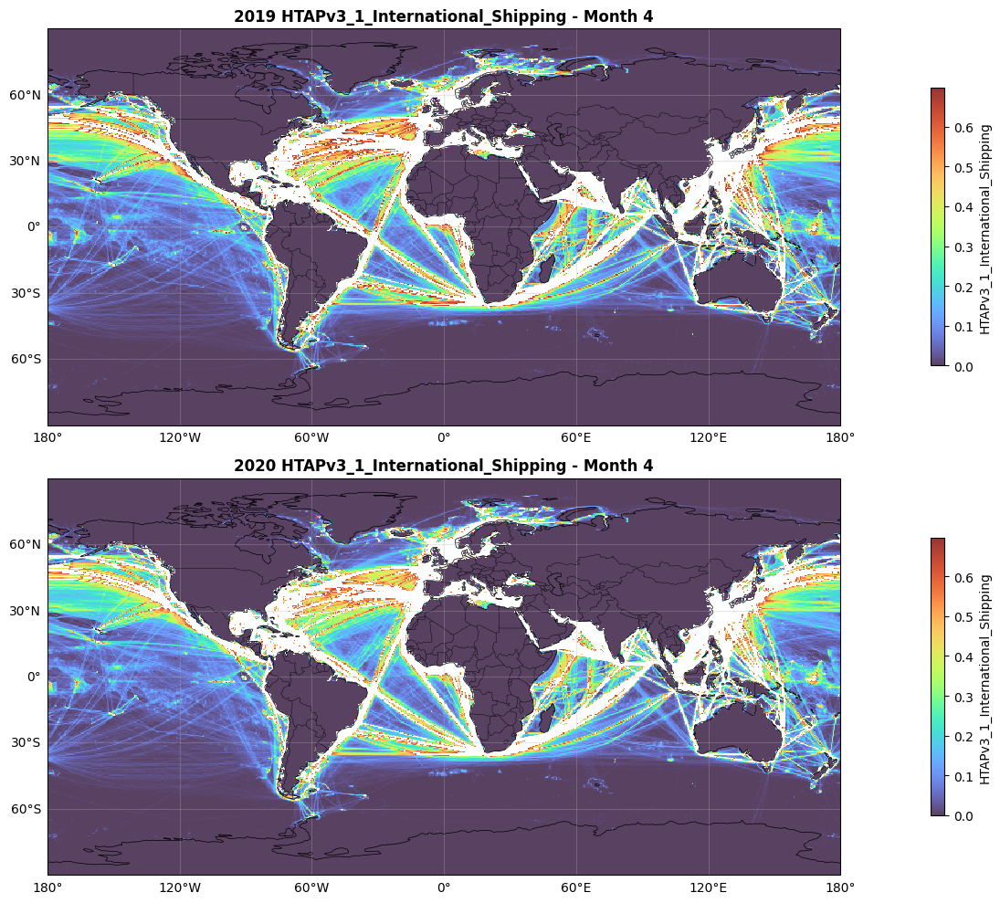

Calculating percentiles for difference data...


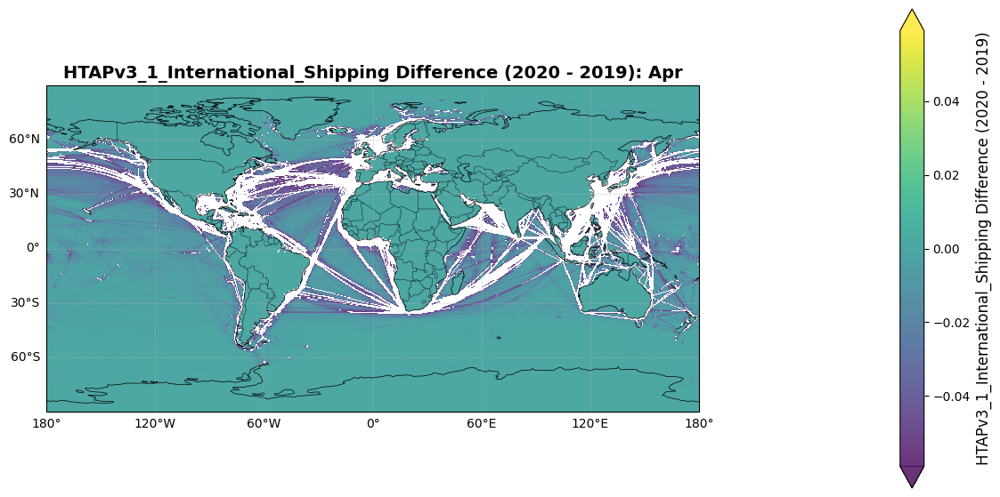

Calculating percentiles for HTAPv3_2_1_1_Domestic_Aviation_LTO...


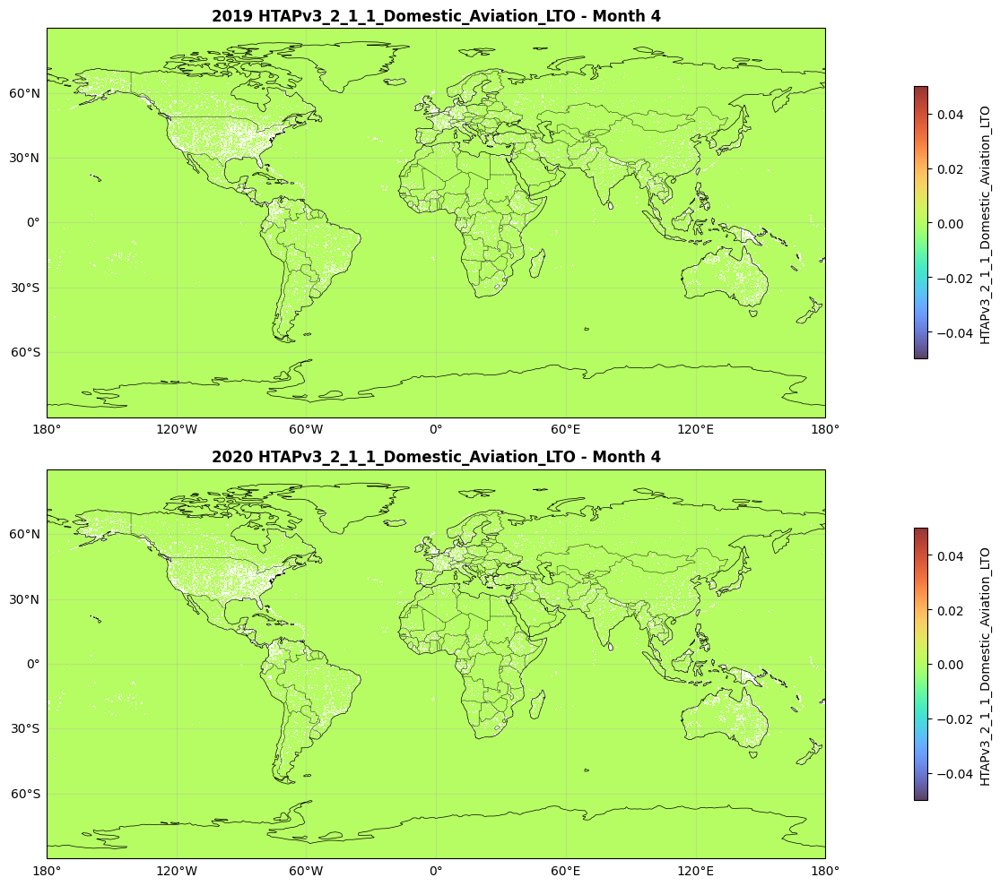

Calculating percentiles for difference data...


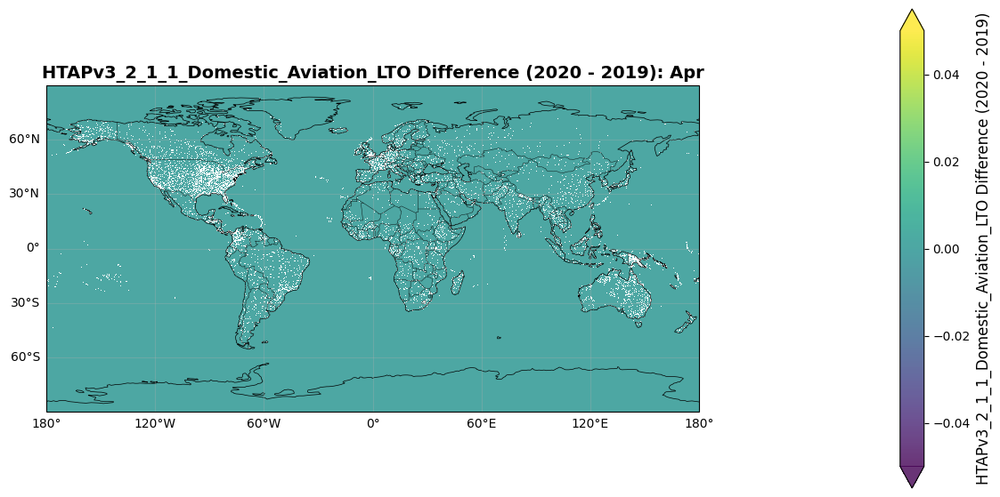

Calculating percentiles for HTAPv3_2_1_2_Domestic_Aviation_CDS...


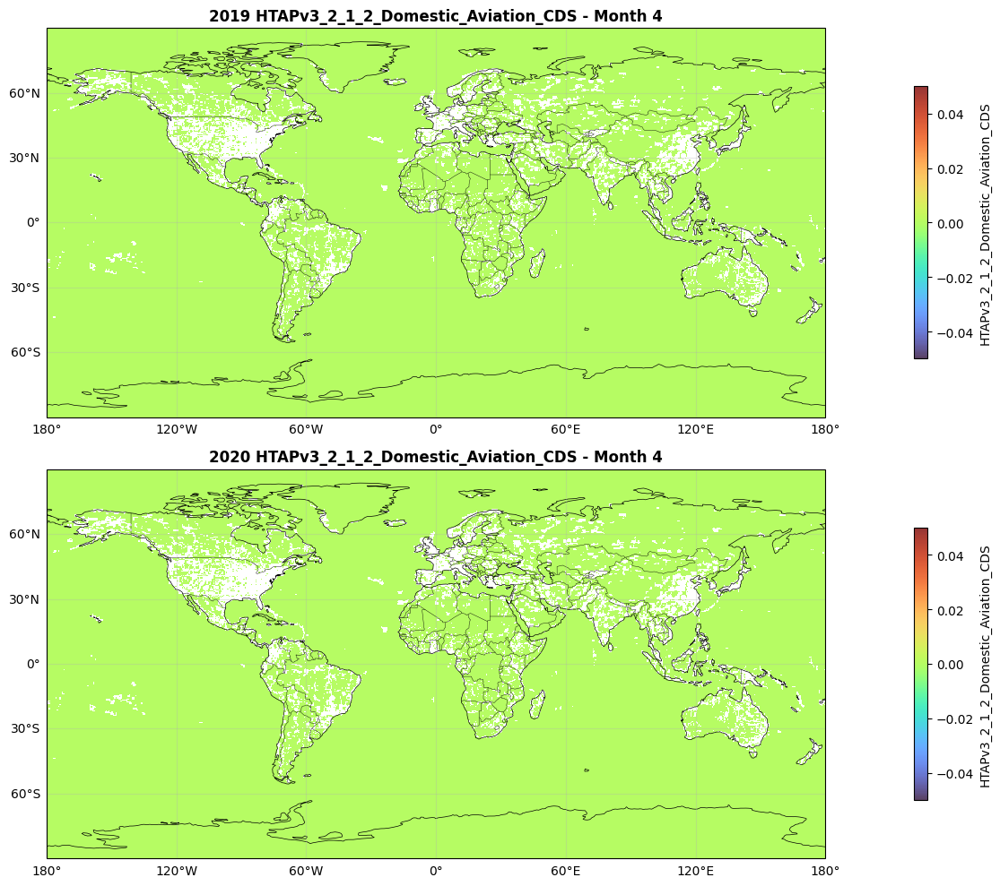

Calculating percentiles for difference data...


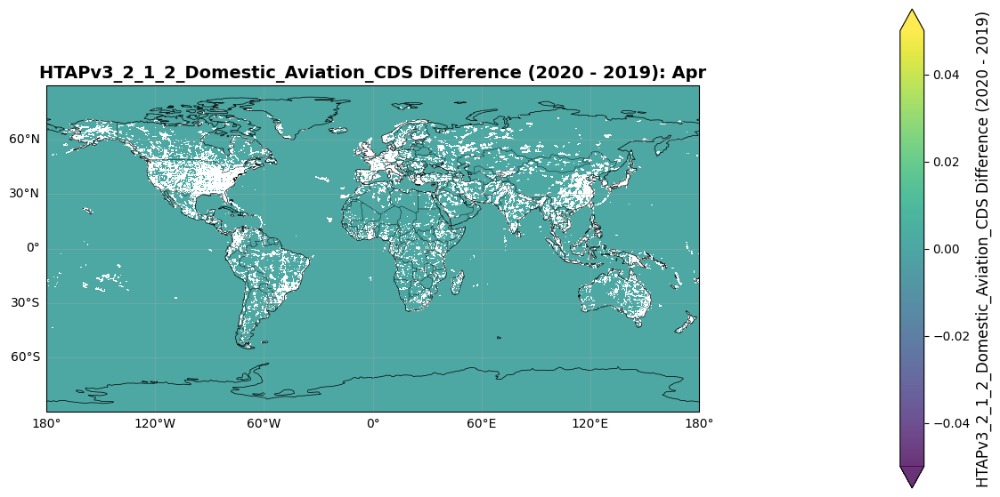

Calculating percentiles for HTAPv3_2_1_3_Domestic_Aviation_CRS...


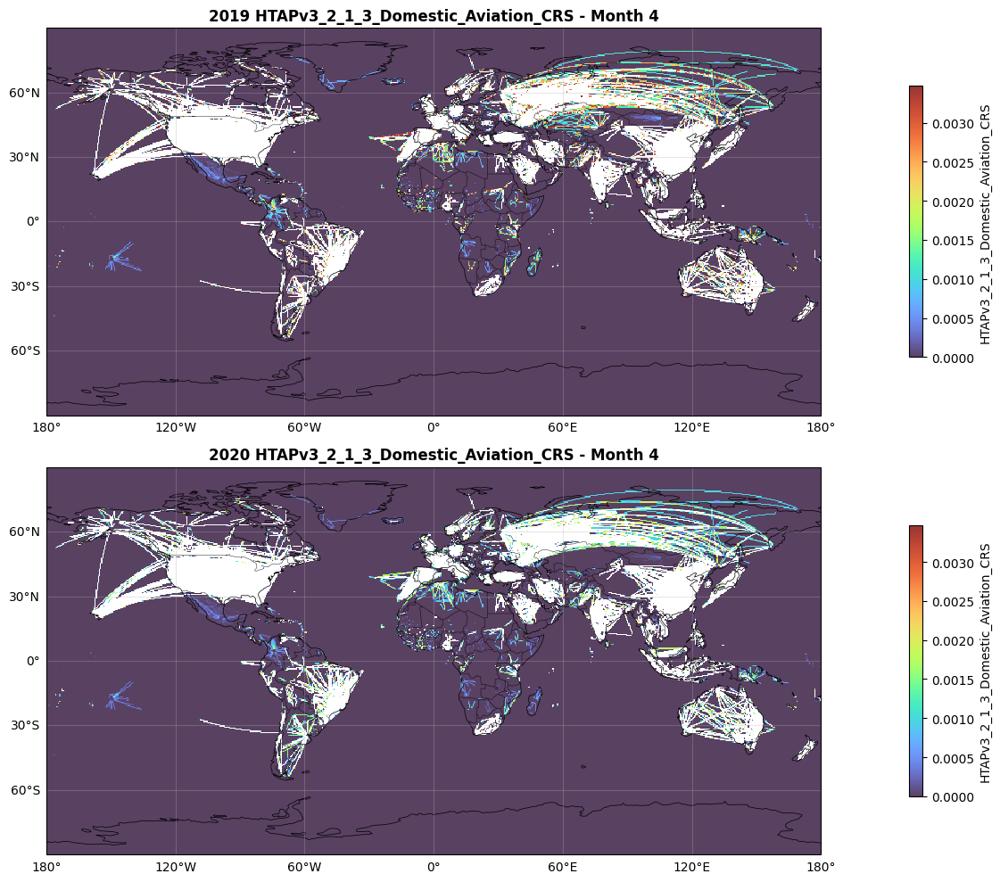

Calculating percentiles for difference data...


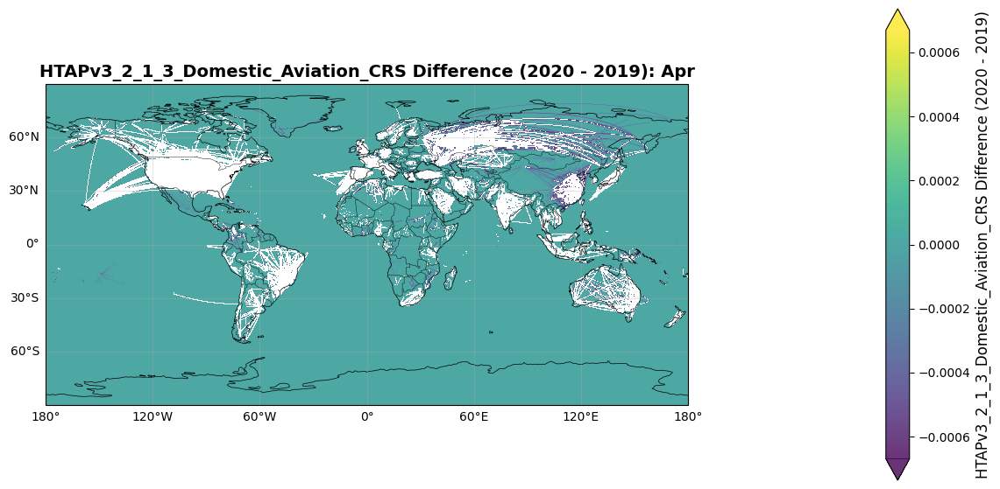

Calculating percentiles for HTAPv3_2_2_1_International_Aviation_LTO...


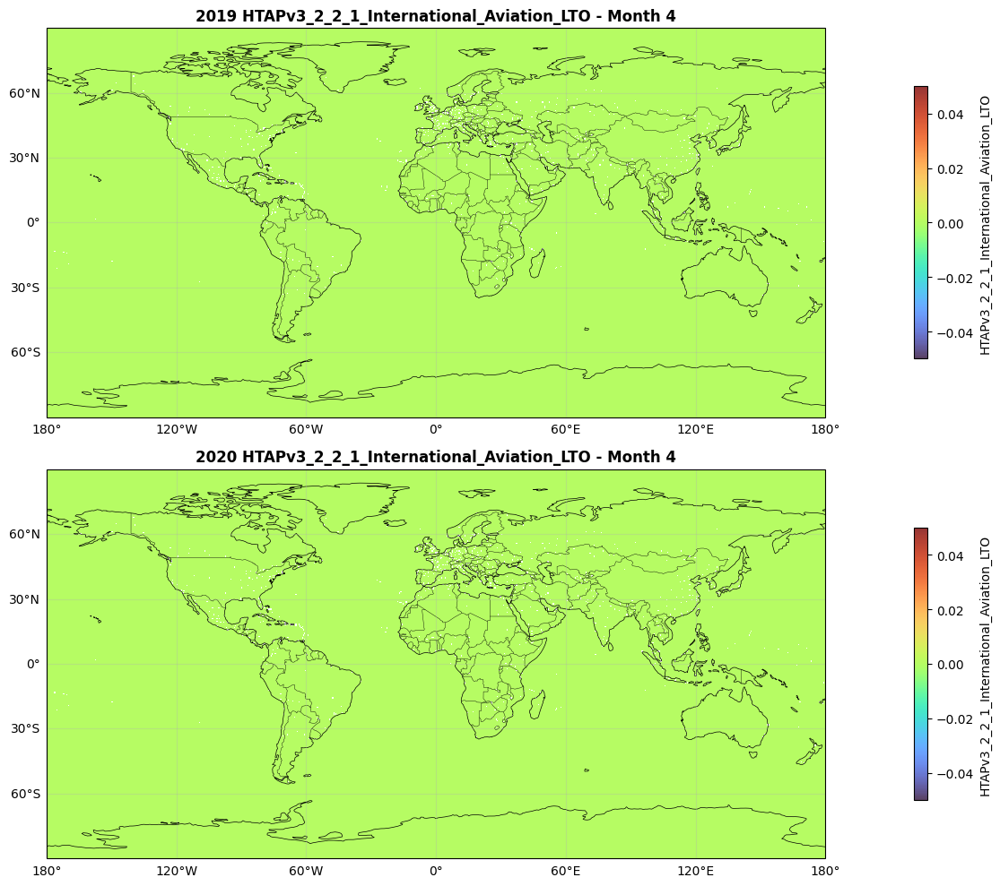

Calculating percentiles for difference data...


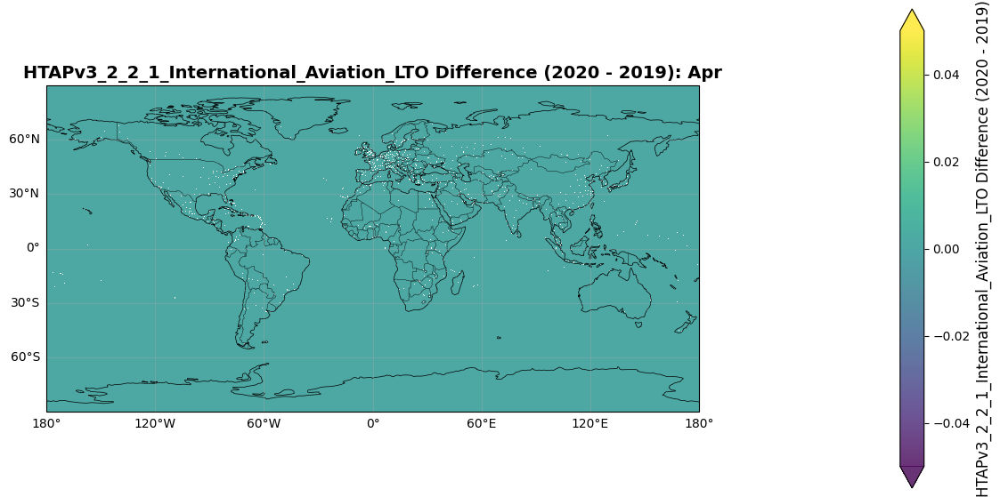

Calculating percentiles for HTAPv3_2_2_2_International_Aviation_CDS...


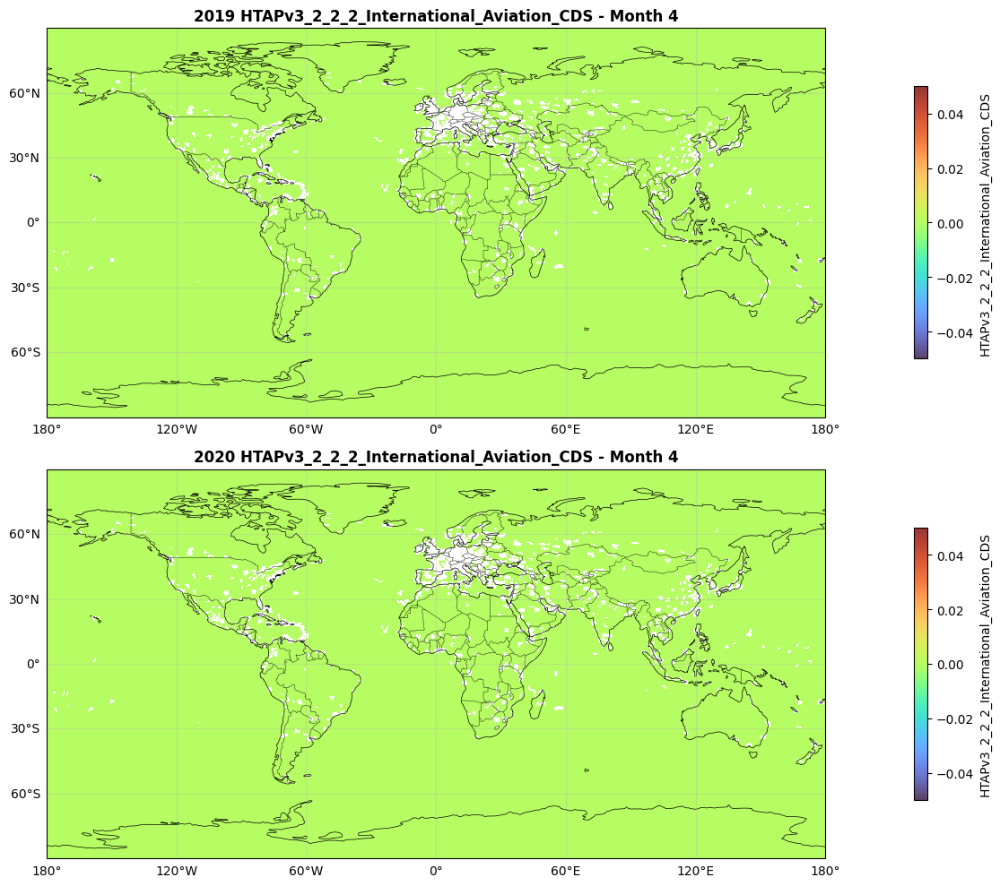

Calculating percentiles for difference data...


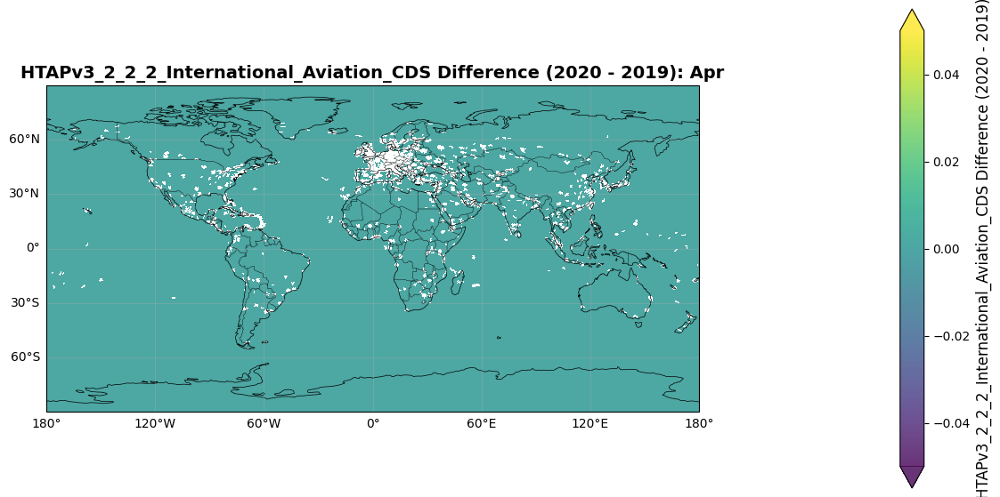

Calculating percentiles for HTAPv3_2_2_3_International_Aviation_CRS...


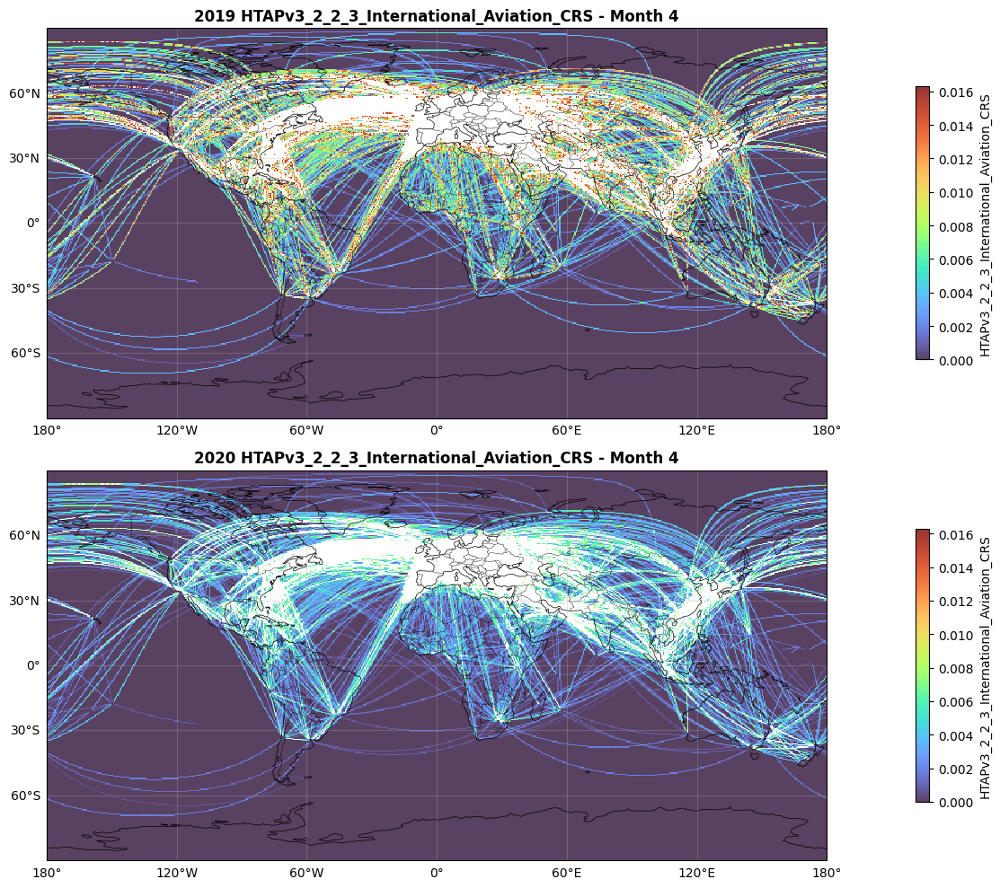

Calculating percentiles for difference data...


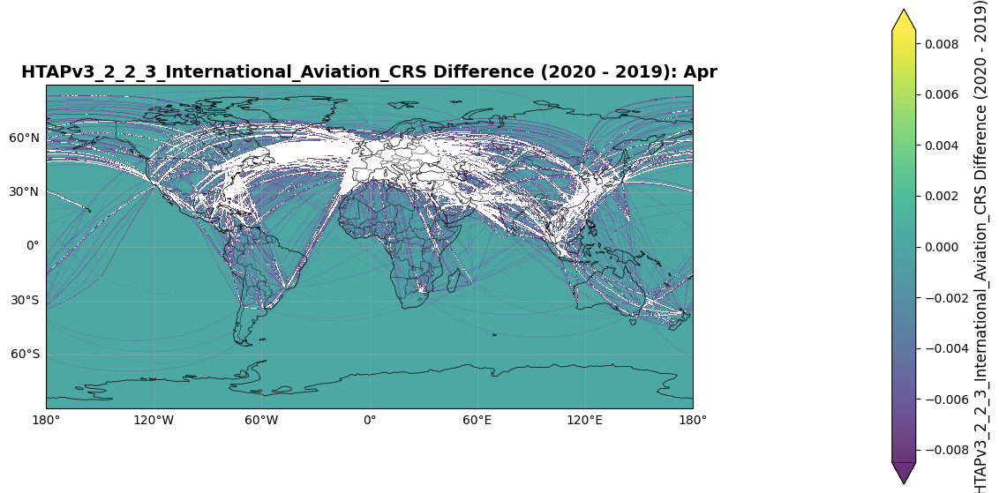

Calculating percentiles for HTAPv3_3_Energy...


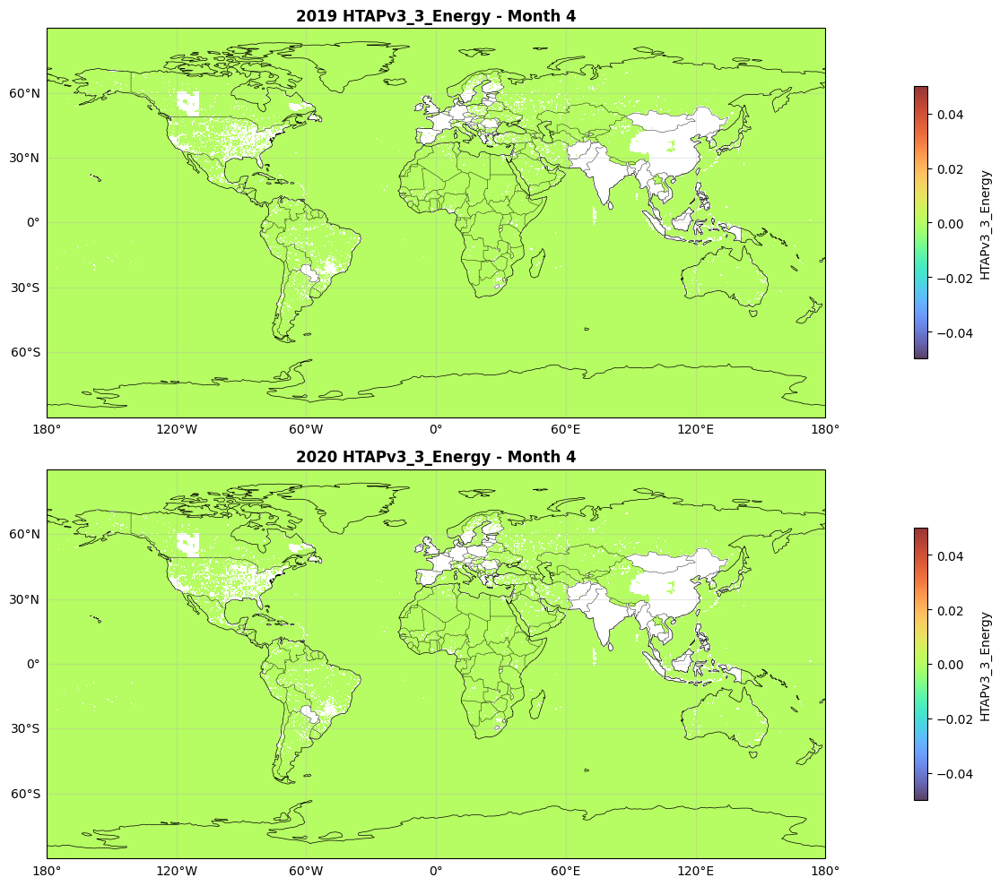

Calculating percentiles for difference data...


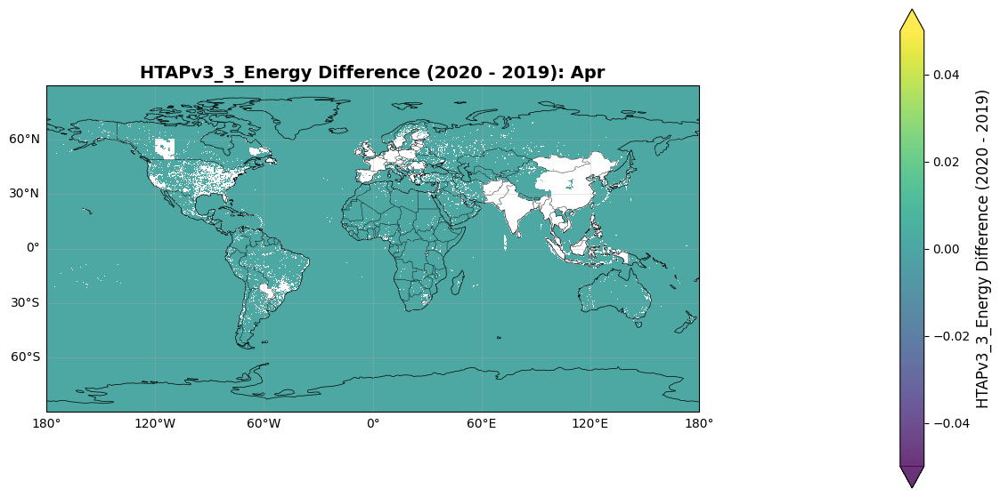

Calculating percentiles for HTAPv3_4_1_Industry...


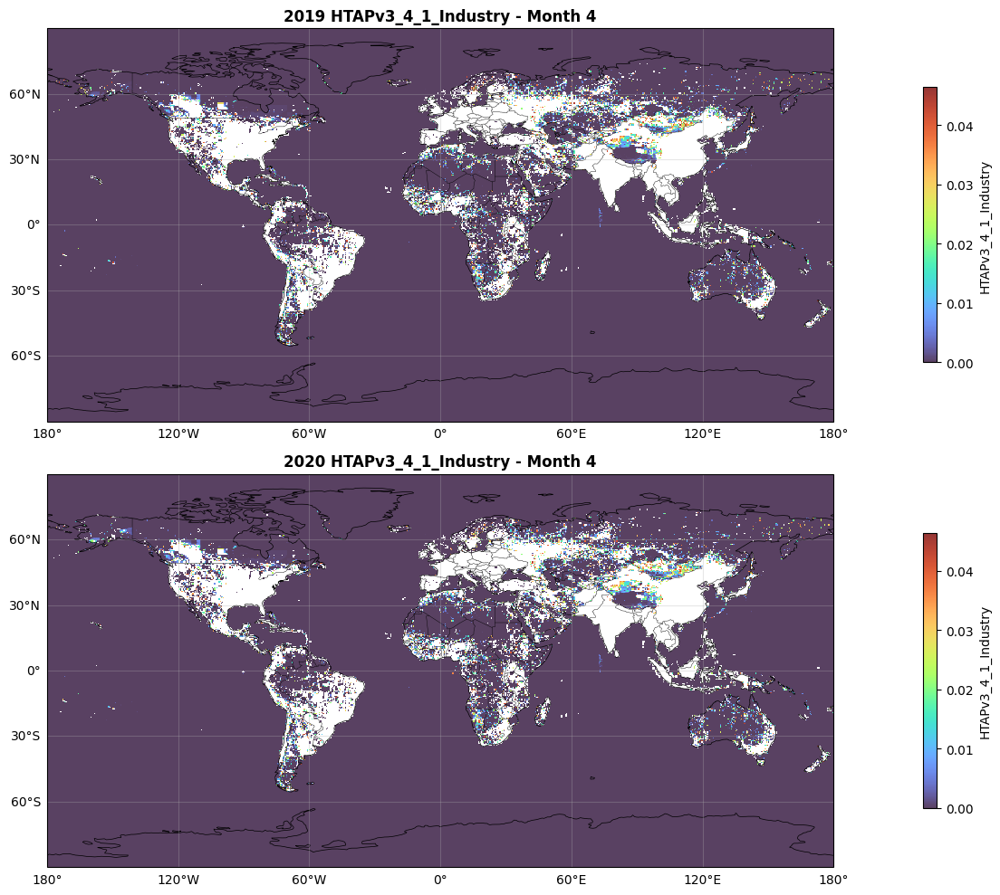

Calculating percentiles for difference data...


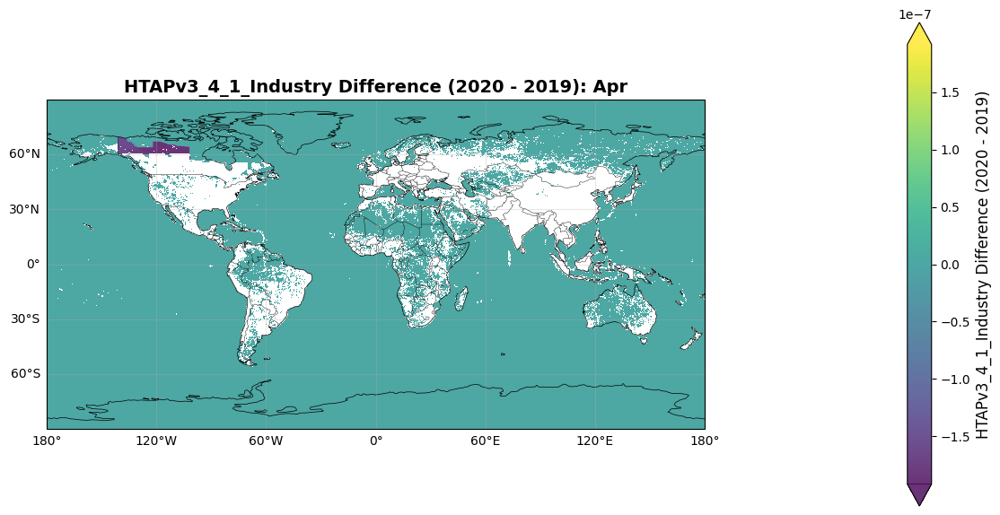

Calculating percentiles for HTAPv3_4_2_Fugitive...


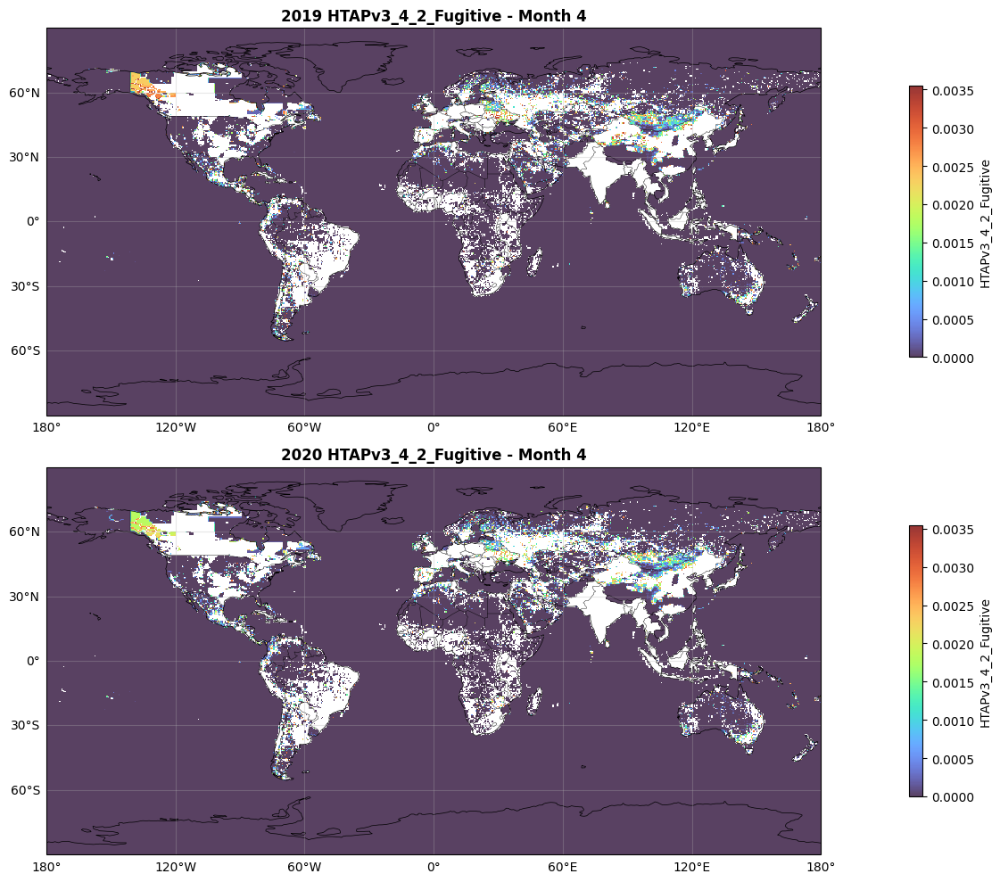

Calculating percentiles for difference data...


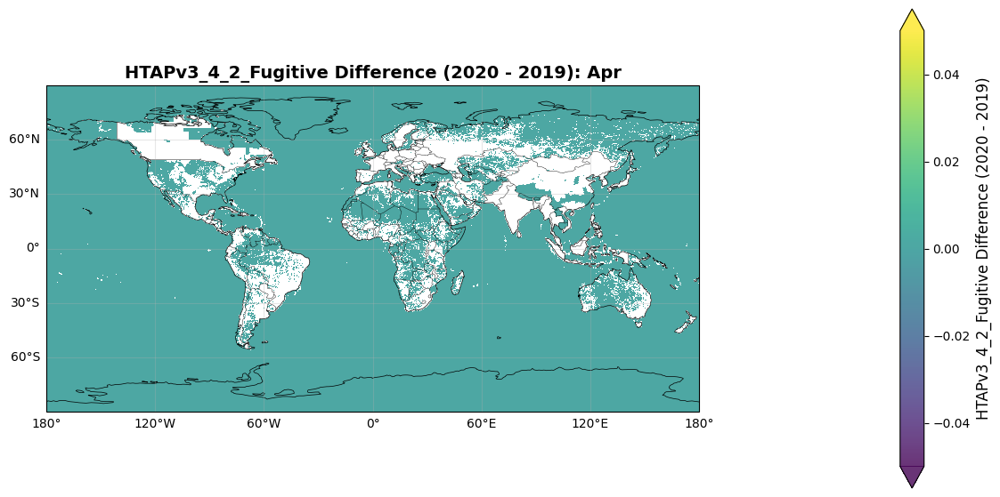

Calculating percentiles for HTAPv3_4_3_Solvents...


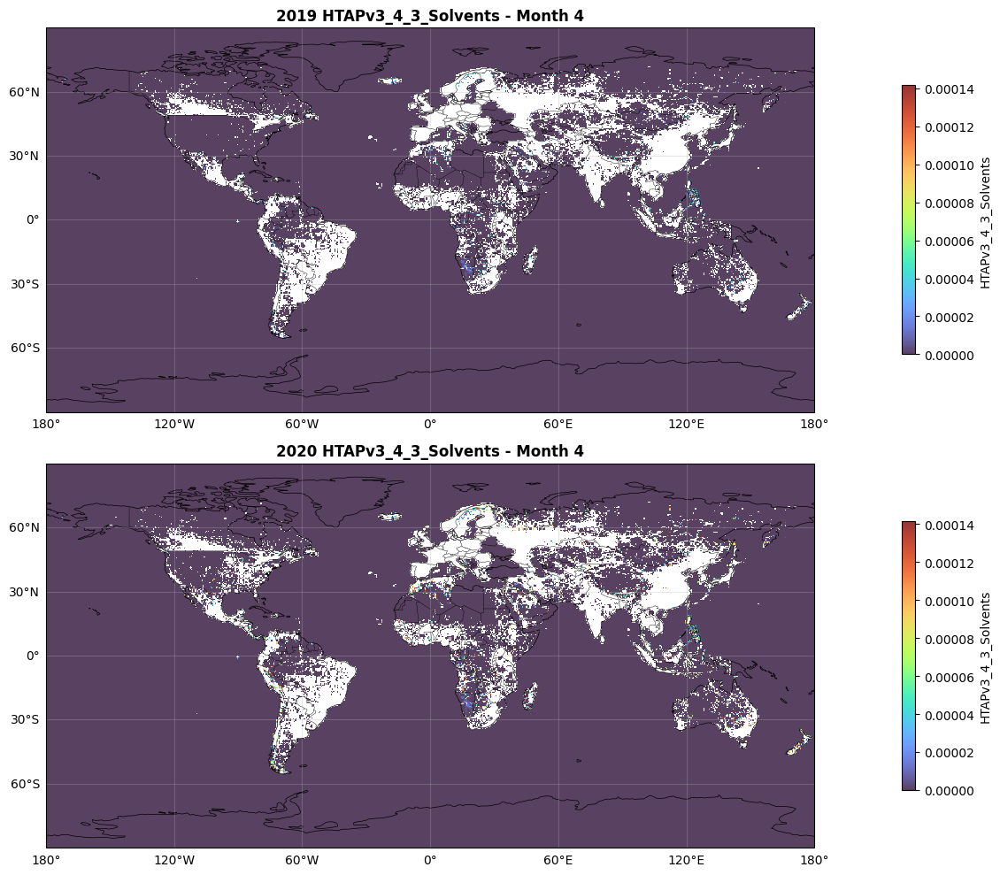

Calculating percentiles for difference data...


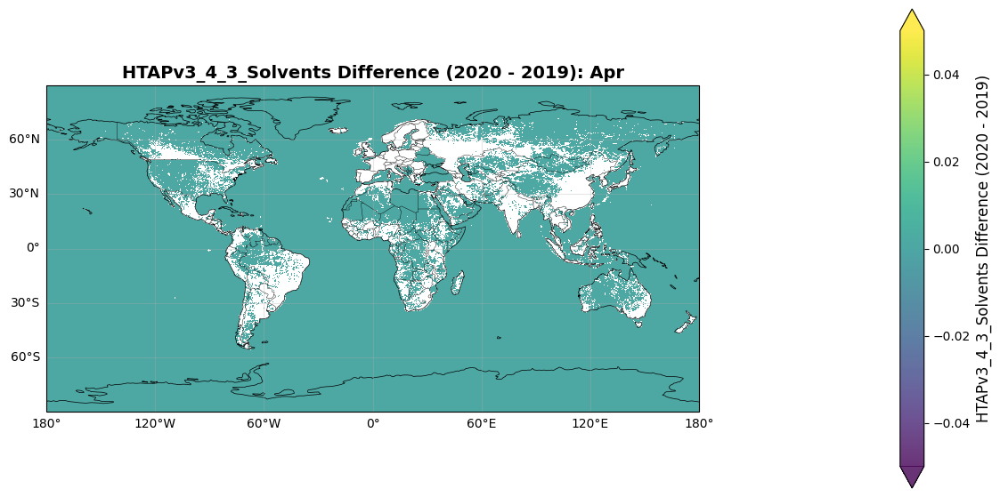

Calculating percentiles for HTAPv3_5_1_Road_Transport...


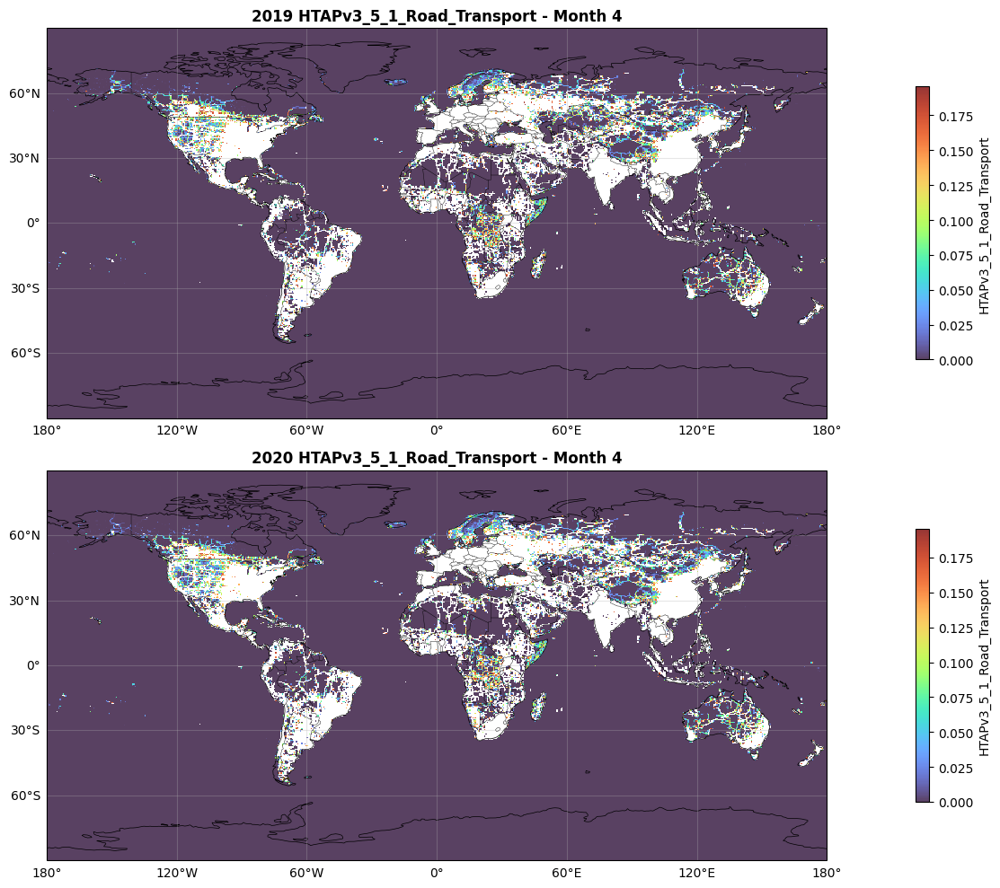

Calculating percentiles for difference data...


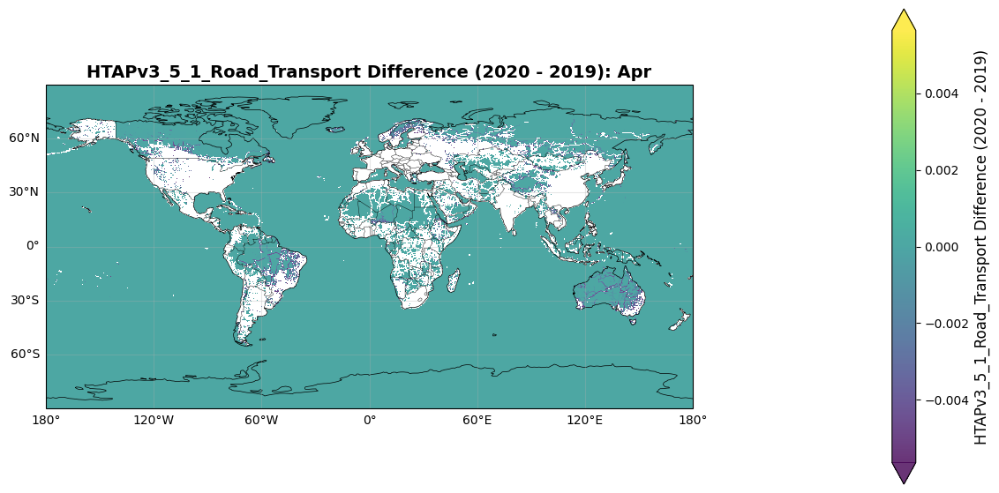

Calculating percentiles for HTAPv3_5_2_Brake_and_Tyre_wear...


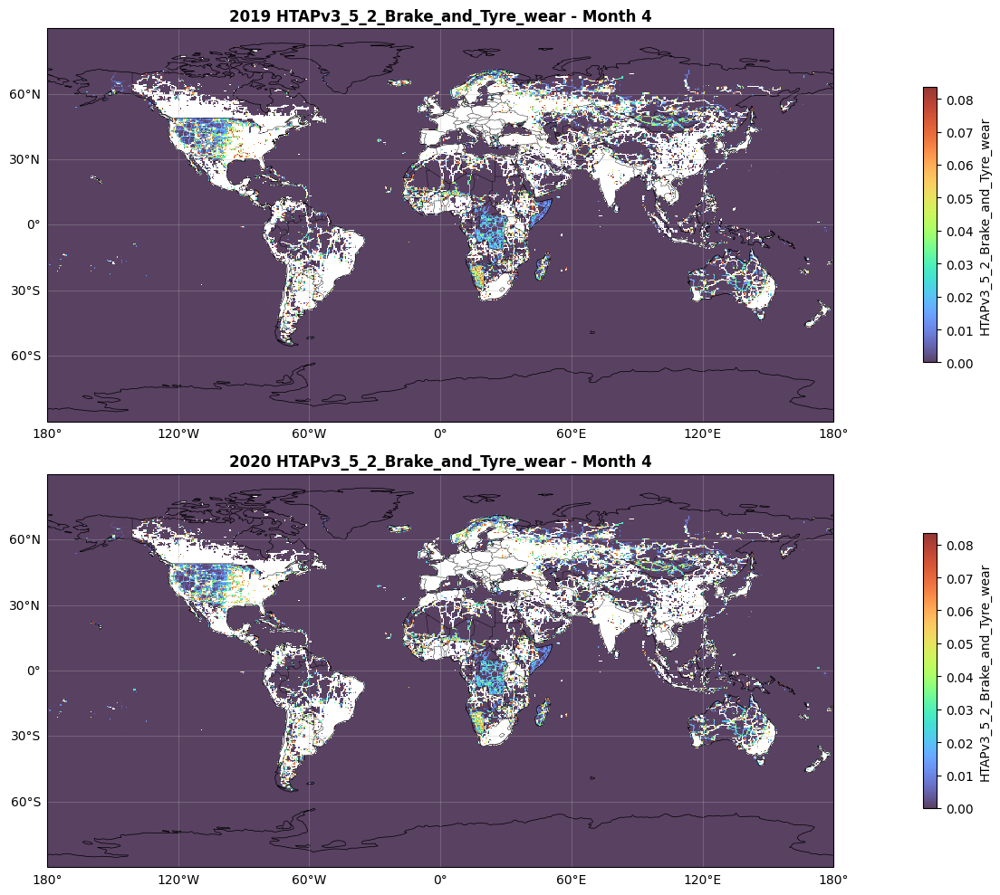

Calculating percentiles for difference data...


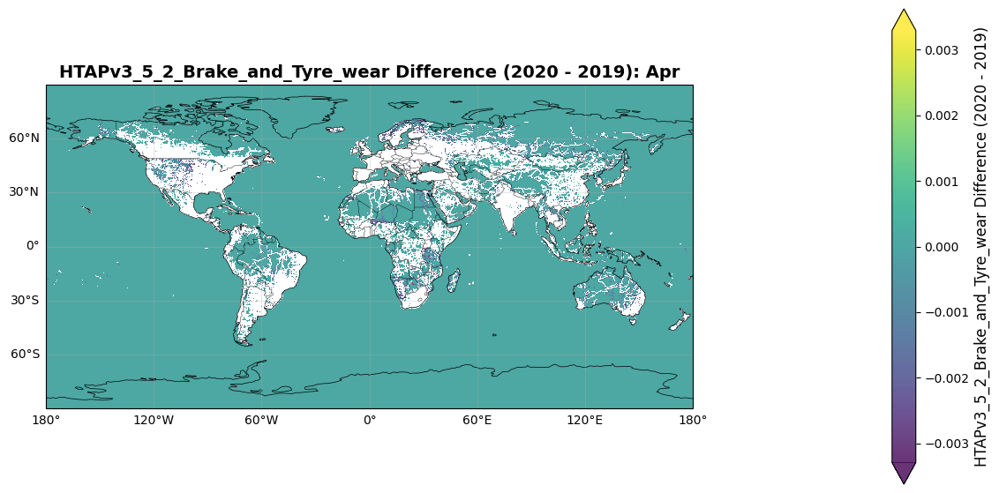

Calculating percentiles for HTAPv3_5_3_Domestic_shipping...


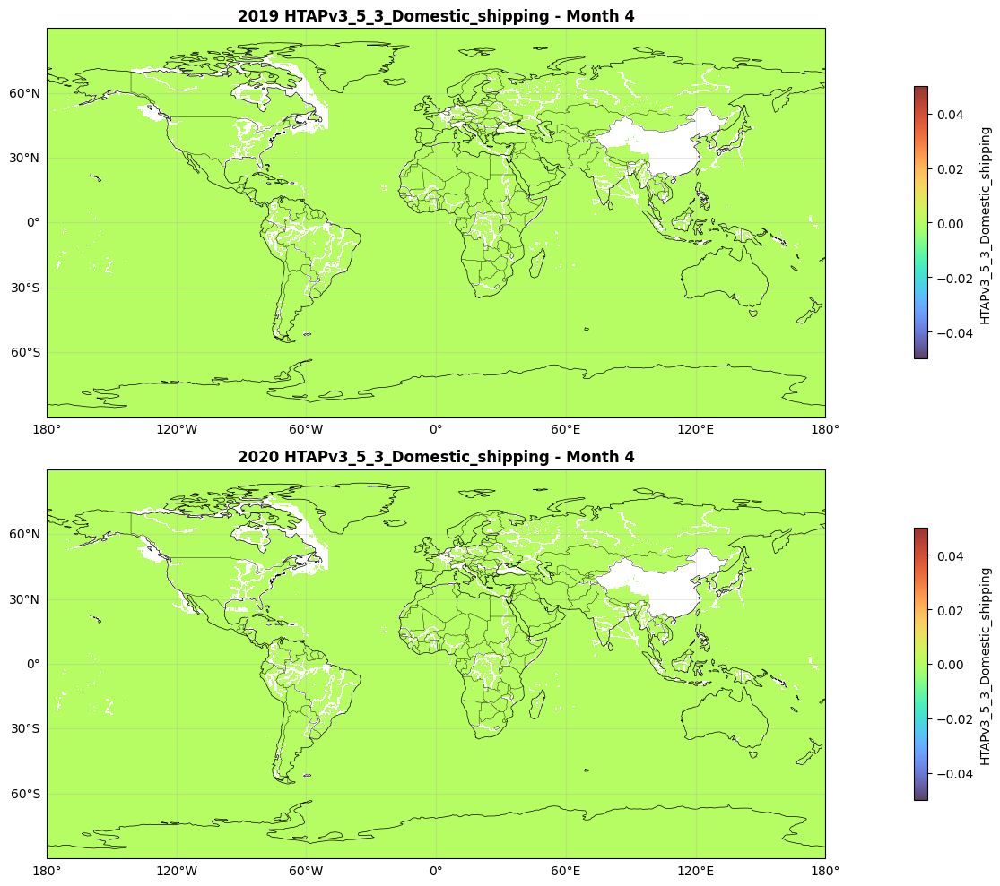

Calculating percentiles for difference data...


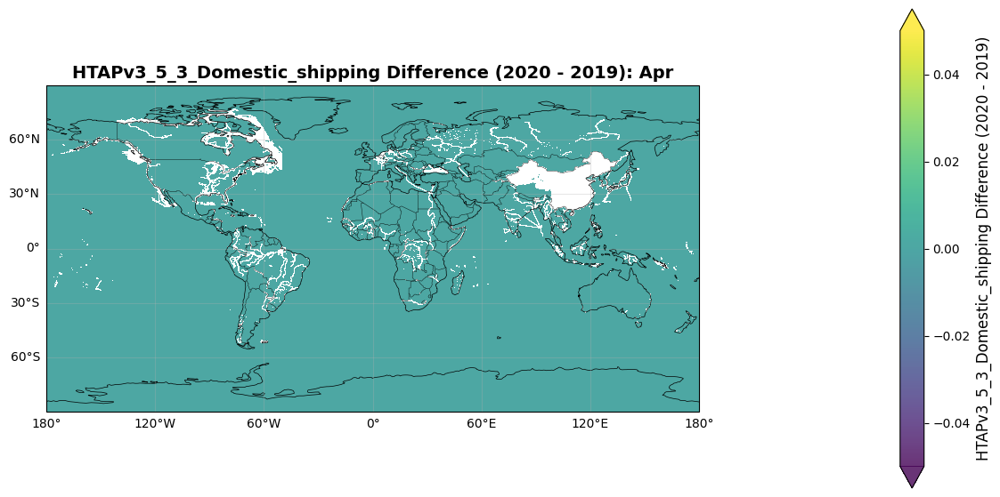

Calculating percentiles for HTAPv3_5_4_Other_ground_transport...


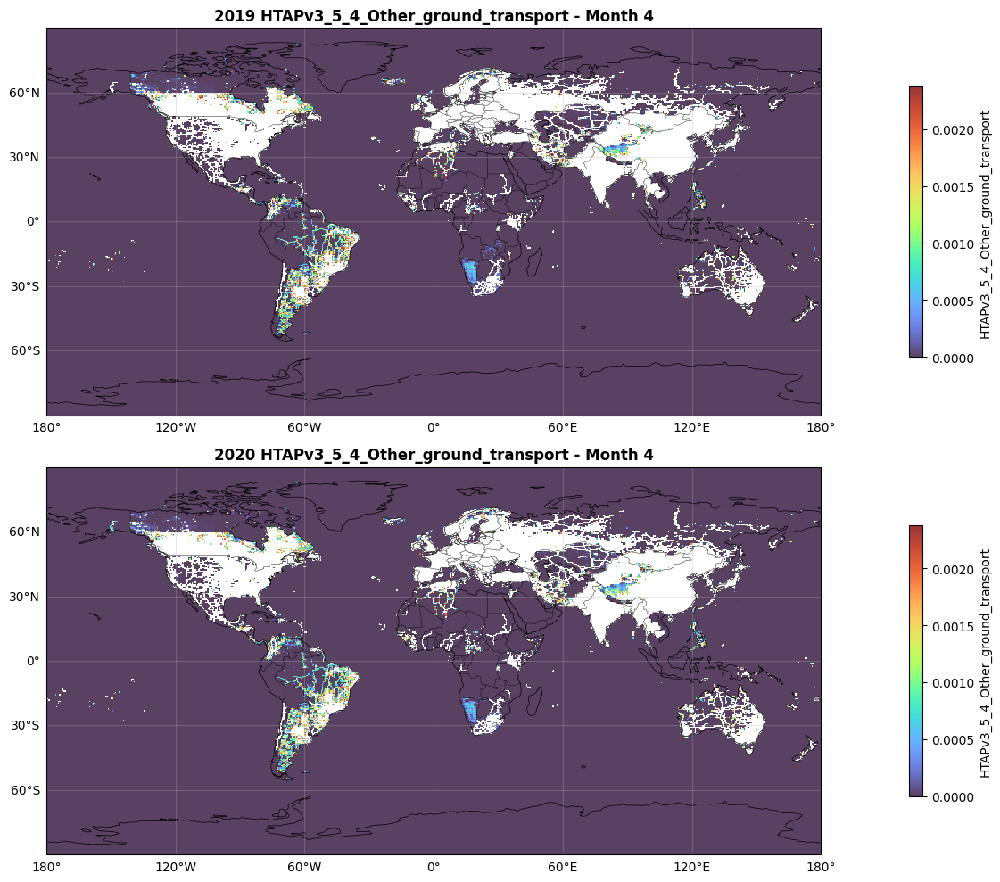

Calculating percentiles for difference data...


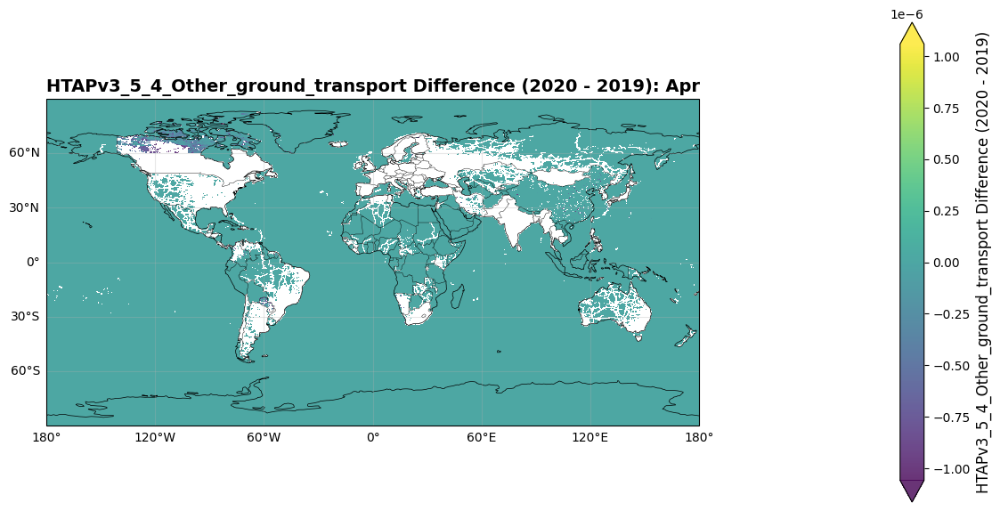

Calculating percentiles for HTAPv3_6_Residential...


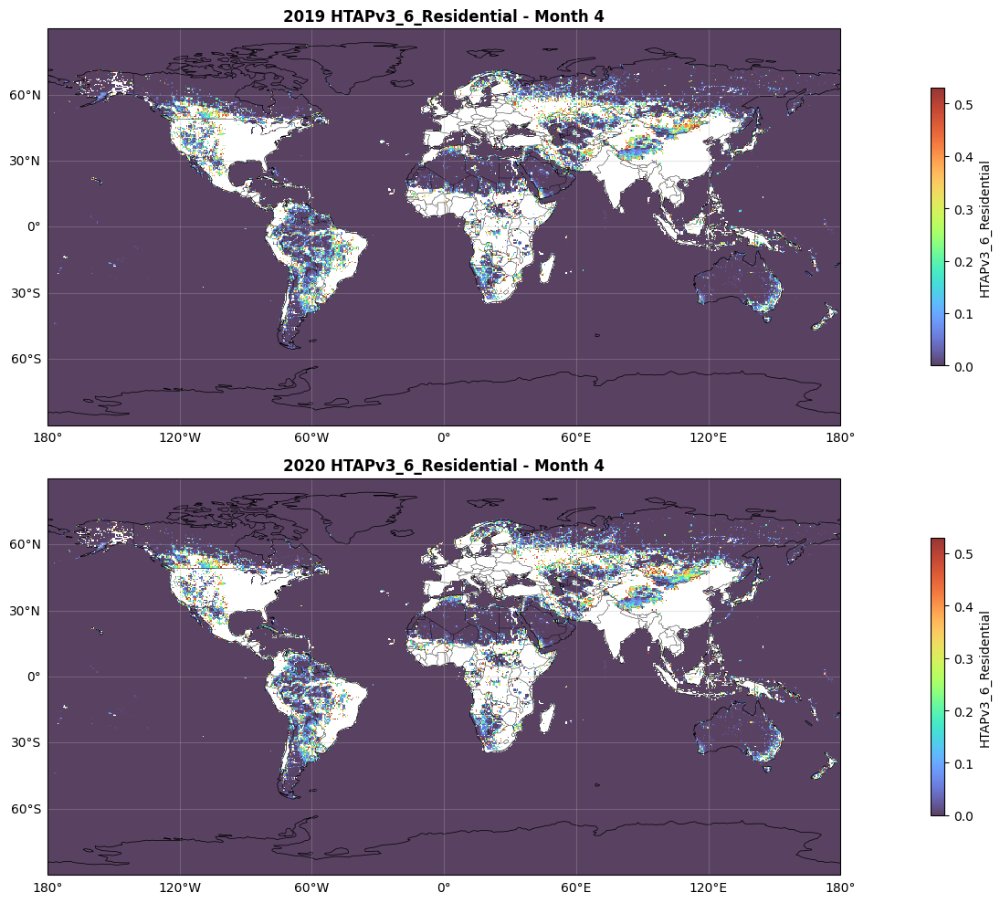

Calculating percentiles for difference data...


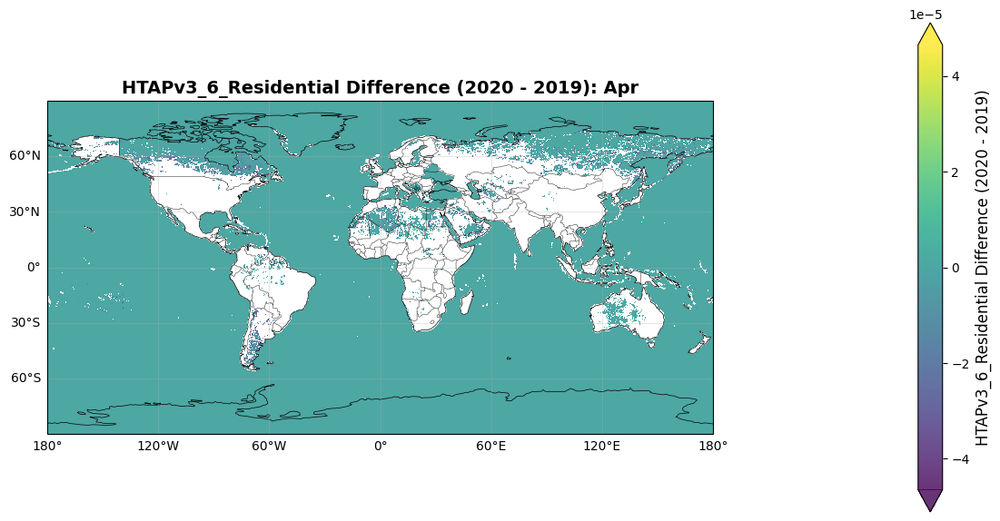

Calculating percentiles for HTAPv3_7_Waste...


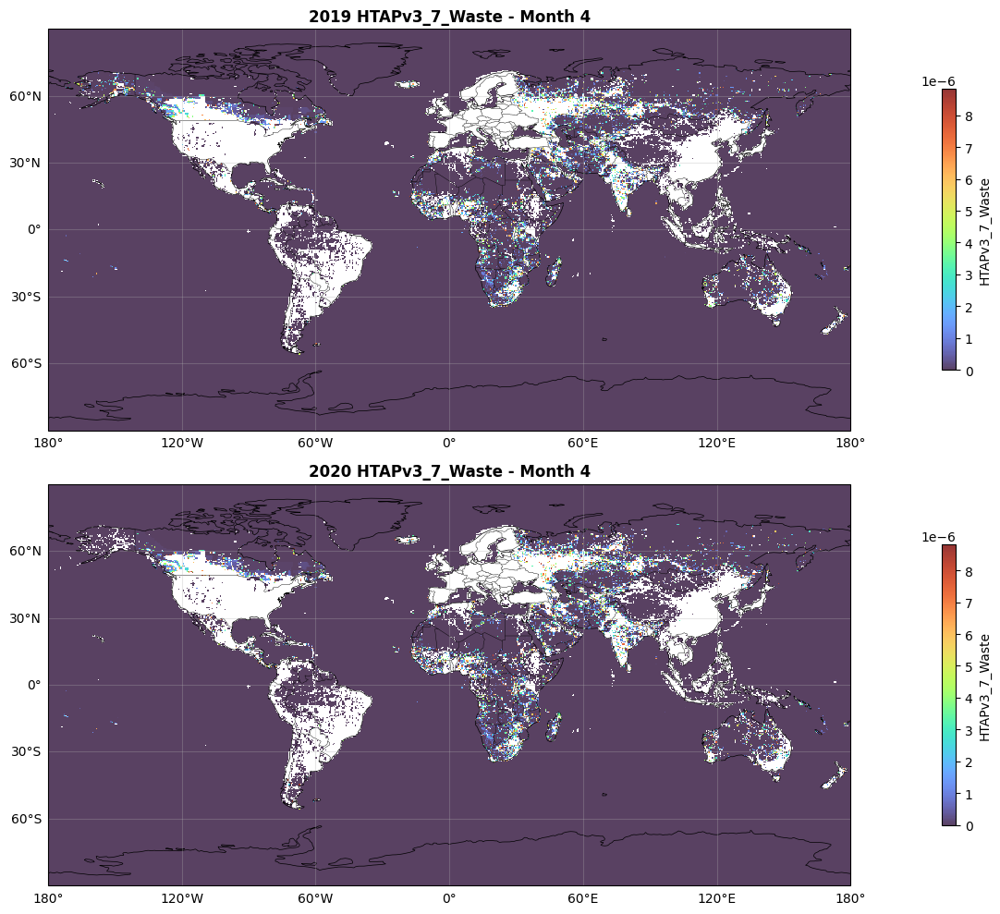

Calculating percentiles for difference data...


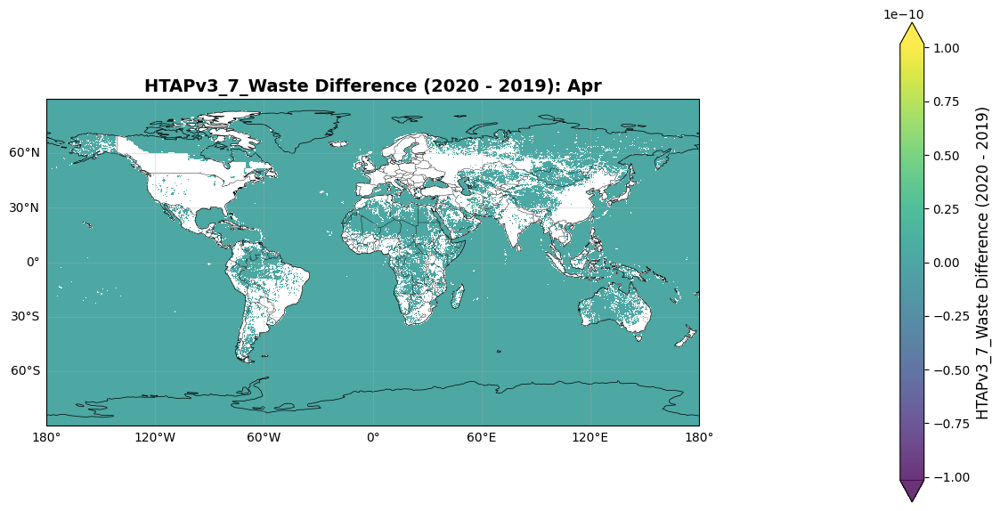

Calculating percentiles for HTAPv3_8_1_Agricultural_waste_burning...


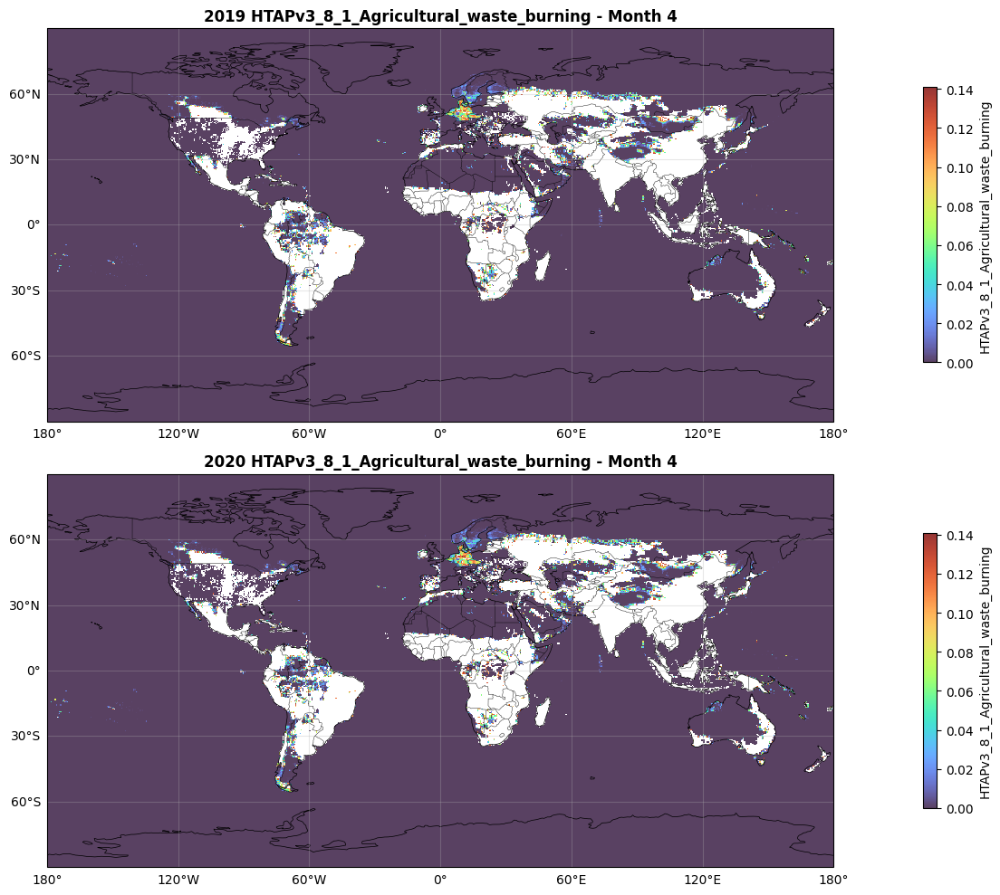

Calculating percentiles for difference data...


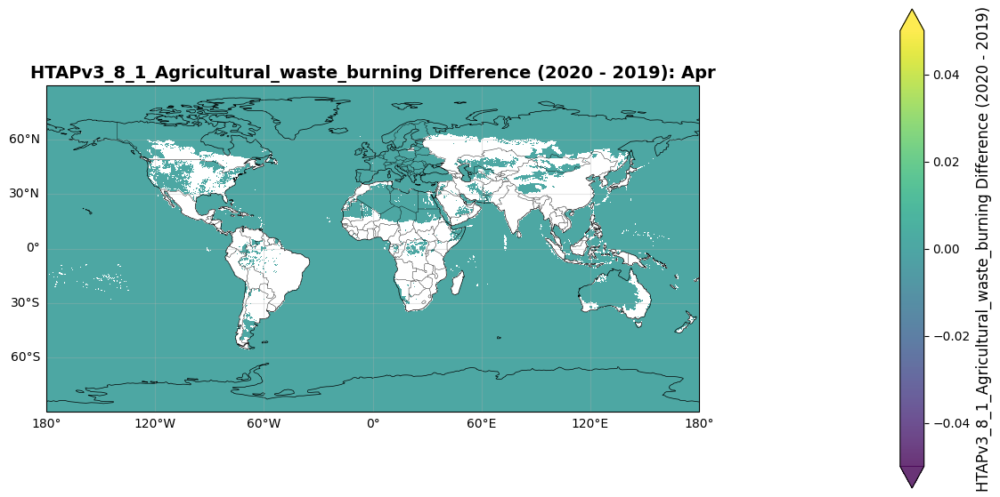

Calculating percentiles for HTAPv3_8_2_Agriculture_livestock...


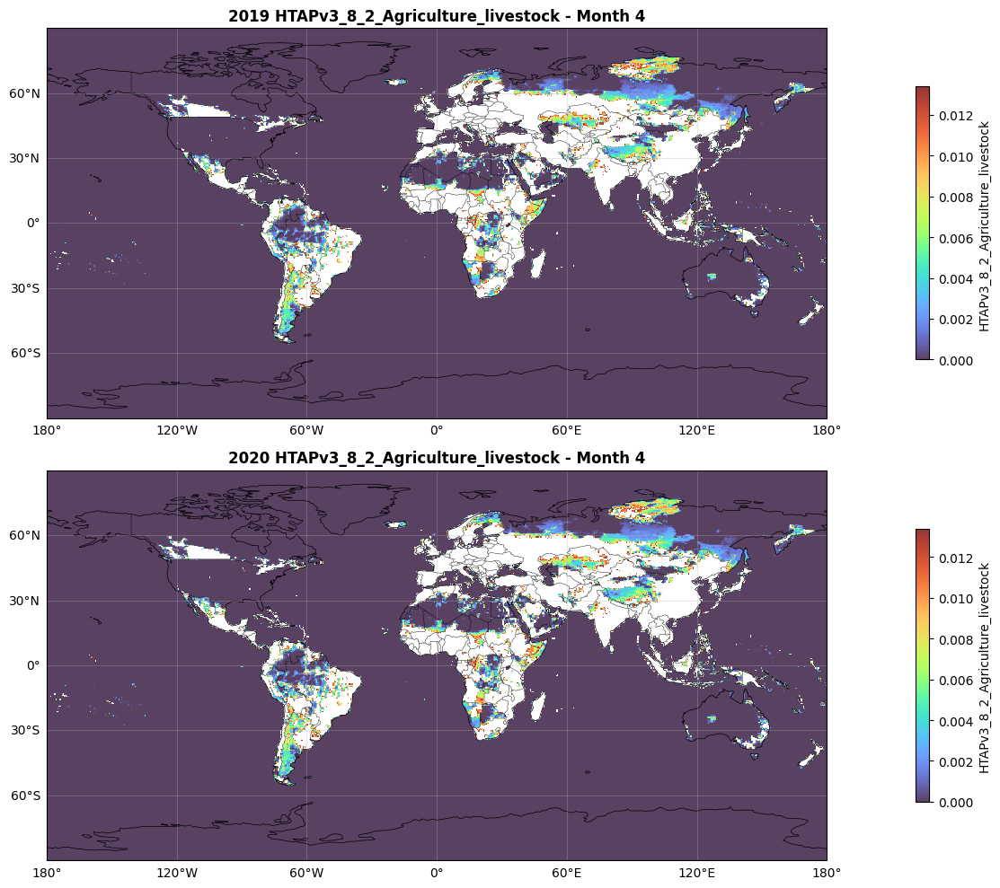

Calculating percentiles for difference data...


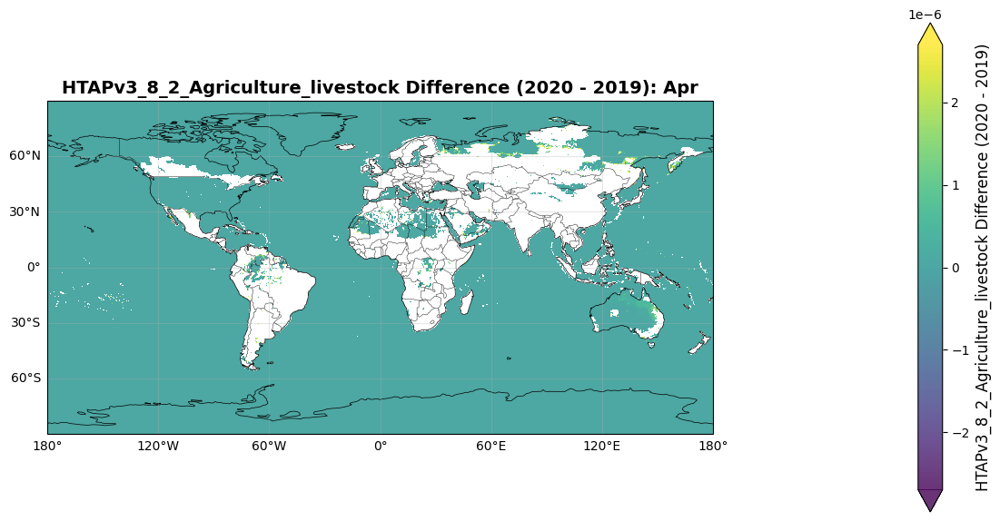

Calculating percentiles for HTAPv3_8_3_Agriculture_crops...


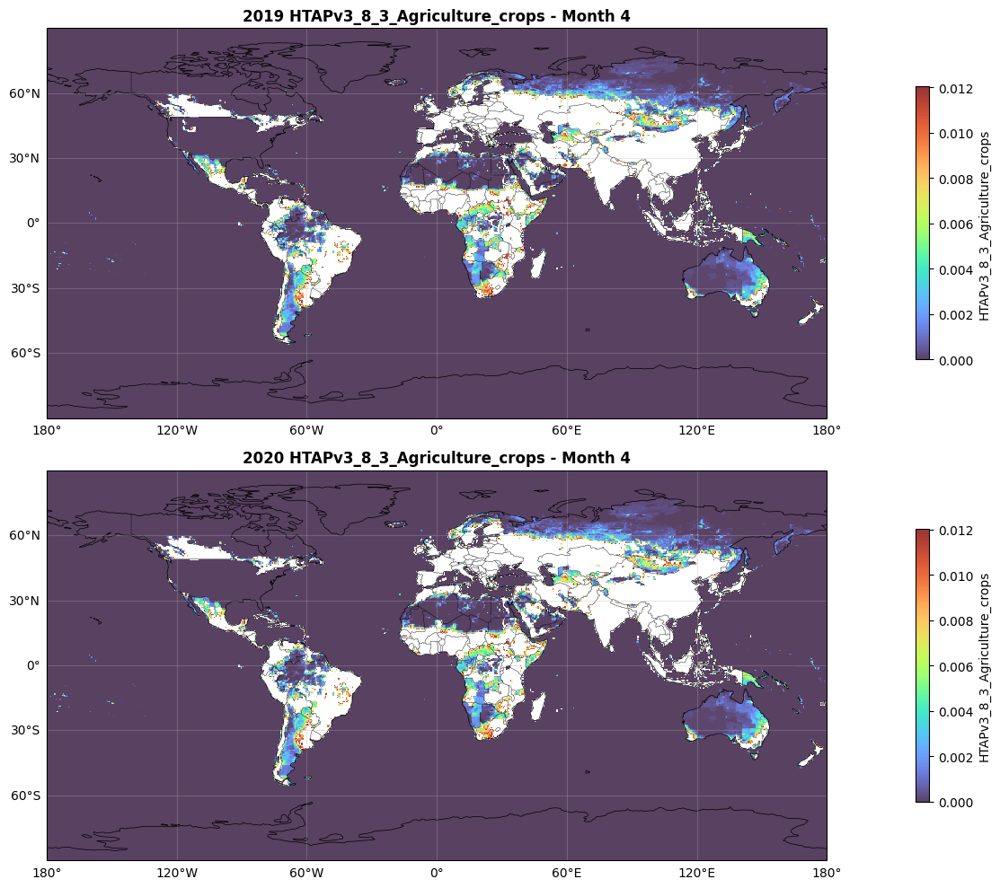

Calculating percentiles for difference data...


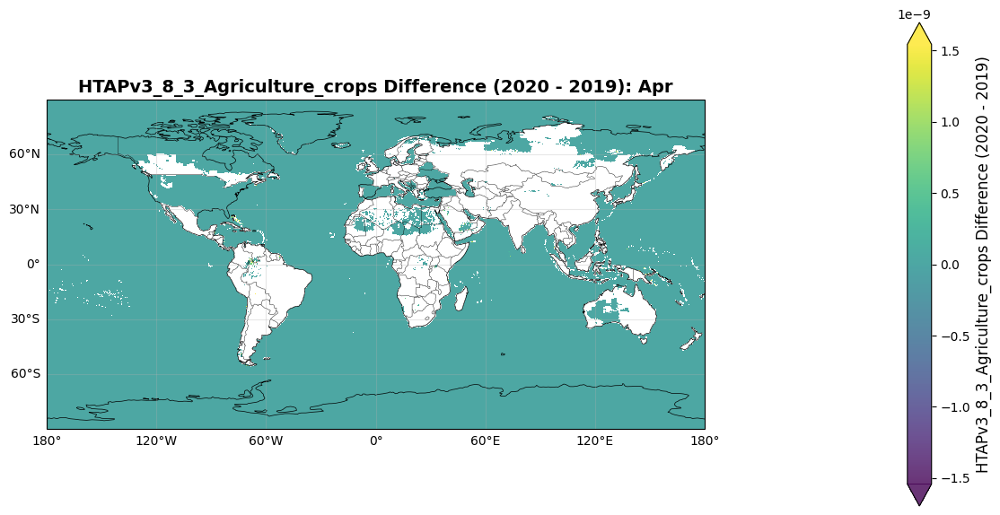

In [51]:
for var in vars_list:
    plot_side_by_side(ds_2019, ds_2020, var, month=4)
    diff, filt_diff = calculate_difference(ds_2019, ds_2020, var, month=4)
    plot_difference(diff, filt_diff, var, month=4)

Calculating percentiles for difference data...


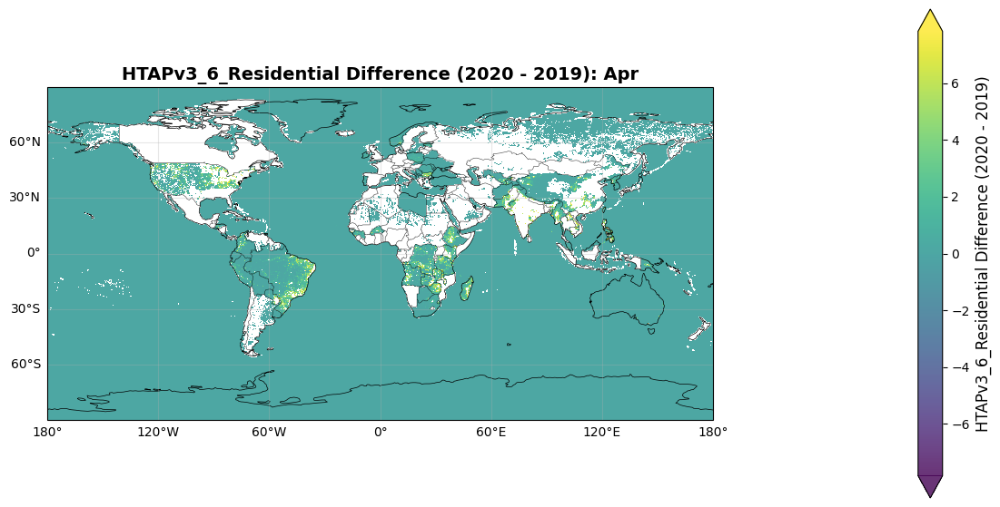

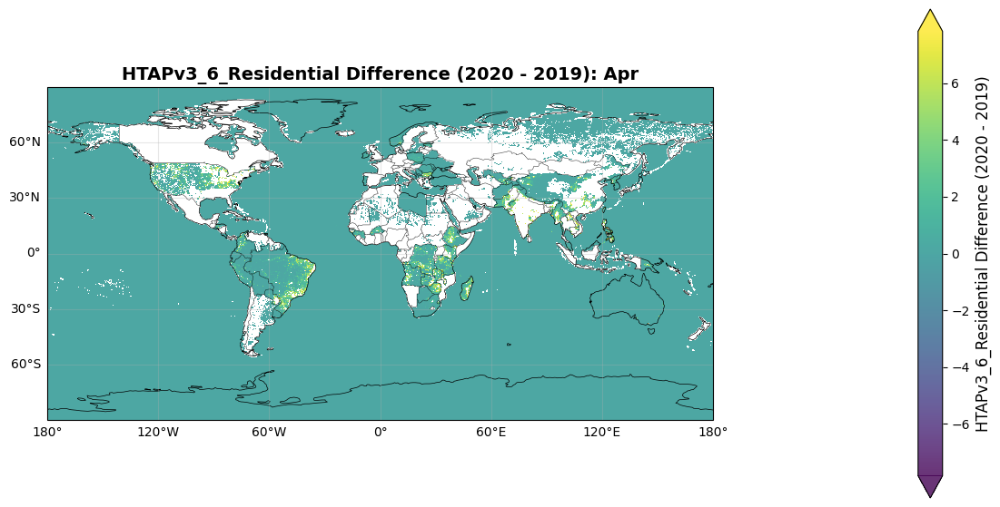

In [319]:
diff, filt_diff = calculate_difference(ds_2019, ds_2020, 'HTAPv3_6_Residential', month=4)
plot_difference(diff, filt_diff, 'HTAPv3_6_Residential', month=4)